# 목차
## 1. 데이터셋 내려받기
## 2. 데이터셋을 모델에 넣을 수 있는 형태로 준비하기
## 3. 모델 직접 설계하기

### 3-1. 모델 설계하기
### 3-2. 모델 학습시키기
### 3-3. 모델 성능 평가하기

## 4. 사전학습 모델 사용하기

### 4-1. VGG16
```
4-1-1. 모델 설계하기
4-1-2. 모델 학습시키기
4-1-3. 모델 성능 평가하기
```
### 4-2. MobileNetV2
```
4-2-1. 모델 설계하기
4-2-2. 모델 학습시키기
4-2-3. 모델 성능 평가하기
```
## 5. 모델 활용하기

In [1]:
# 경고메시지 삭제
import warnings
warnings.filterwarnings("ignore")

import tensorflow_datasets as tfds

# 1. 데이터셋 내려받기

In [2]:
import tensorflow_datasets as tfds

# tf_flowers 데이터셋 로드
# train_data, validation_data, test_data 나누기
(raw_train, raw_validation, raw_test), metadata = tfds.load(
    name='tf_flowers',  
    split=['train[:80%]', 'train[80%:90%]', 'train[90%:]'],
    data_dir='~/aiffel/tf_flowers/',
    download=True,
    with_info=True,
    as_supervised=True,
)

print("데이터셋 다운로드 완료!")

데이터셋 다운로드 완료!


In [3]:
import collections

# 클래스 이름 가져오기
class_names = metadata.features['label'].names
print("클래스 이름:", class_names)

# 클래스별 이미지 개수 계산
label_counts = collections.Counter()
for image, label in raw_train.concatenate(raw_validation).concatenate(raw_test):
    label_counts[int(label.numpy())] += 1

# 클래스별 이미지 개수 출력
for idx, count in sorted(label_counts.items()):
    print(f"{class_names[idx]}: {count} 개")

클래스 이름: ['dandelion', 'daisy', 'tulips', 'sunflowers', 'roses']
dandelion: 898 개
daisy: 633 개
tulips: 799 개
sunflowers: 699 개
roses: 641 개


In [4]:
# 필요한 라이브러리 불러오기
import tensorflow as tf
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

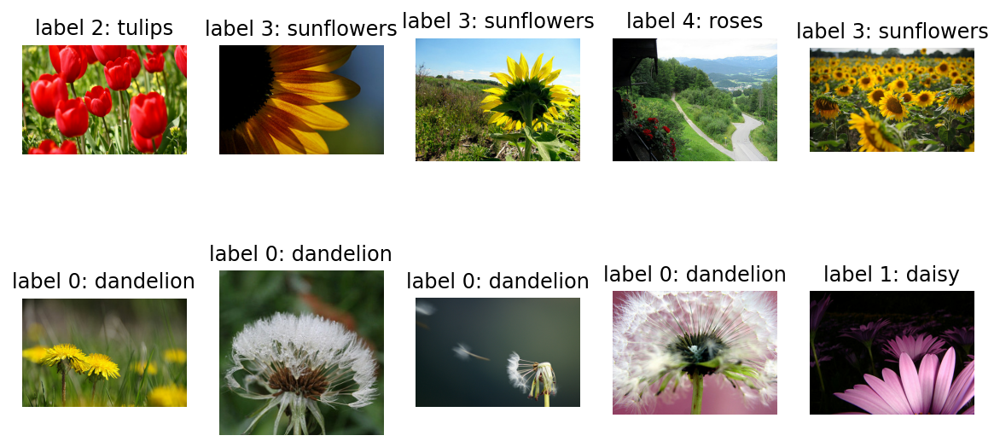

In [5]:
# raw_train 데이터 확인
plt.figure(figsize=(10, 5))

get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(raw_train.take(10)):  # 10개의 데이터 가져오기
    plt.subplot(2, 5, idx+1)
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

# 2. 데이터셋을 모델에 넣을 수 있는 형태로 준비하기

In [6]:
IMG_SIZE = 160 # 이미지 사이즈를 160x160 픽셀로 통일시키기

def format_example(image, label):
    image = tf.cast(image, tf.float32) 
    image = (image/127.5) - 1 # 픽셀값의 scale 수정
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))
    return image, label

In [7]:
train = raw_train.map(format_example)
validation = raw_validation.map(format_example)
test = raw_test.map(format_example)

print(train)
print(validation)
print(test)

<MapDataset shapes: ((160, 160, 3), ()), types: (tf.float32, tf.int64)>
<MapDataset shapes: ((160, 160, 3), ()), types: (tf.float32, tf.int64)>
<MapDataset shapes: ((160, 160, 3), ()), types: (tf.float32, tf.int64)>


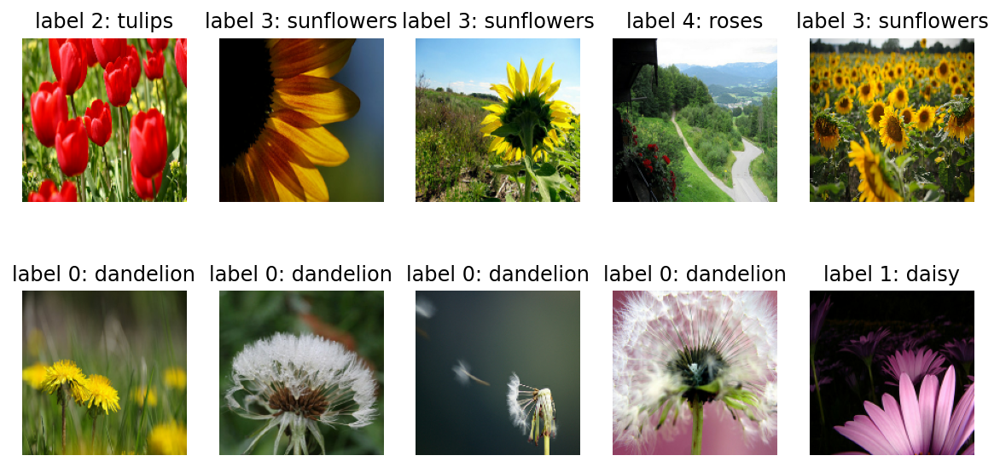

In [8]:
plt.figure(figsize=(10, 5))


get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(train.take(10)):
    plt.subplot(2, 5, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

# 3. 모델 직접 설계하기

## 3-1. 모델 설계하기

In [9]:
# 모델 생성에 필요한 함수 가져오기
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Flatten, MaxPooling2D

import numpy as np

In [10]:
model = Sequential([
    Conv2D(filters=16, kernel_size=3, padding='same', activation='relu', input_shape=(160, 160, 3)),
    MaxPooling2D(),
    Conv2D(filters=32, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Conv2D(filters=64, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Flatten(),
    Dense(units=512, activation='relu'),
    Dense(units=5, activation='softmax') # 5개의 클래스
])

In [11]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 160, 160, 16)      448       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 80, 80, 16)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 80, 80, 32)        4640      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 40, 40, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 40, 40, 64)        18496     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 20, 20, 64)        0         
_________________________________________________________________
flatten (Flatten)            (None, 25600)             0

## 3-2. 모델 학습시키기

In [12]:
# 모델 compile
learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

In [13]:
BATCH_SIZE = 32 # 전체 데이터 중 32개를 랜덤으로 제공
SHUFFLE_BUFFER_SIZE = 1000

train_batches = train.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE)
validation_batches = validation.batch(BATCH_SIZE)
test_batches = test.batch(BATCH_SIZE)

In [14]:
# 초기 모델 성능
validation_steps = 20
loss0, accuracy0 = model.evaluate(validation_batches, steps=validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

12/20 [=================>............] - ETA: 0s - loss: 1.5818 - accuracy: 0.2616WARNING:tensorflow:Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches (in this case, 20 batches). You may need to use the repeat() function when building your dataset.


20/20 [==============================] - 3s 12ms/step - loss: 1.5818 - accuracy: 0.2616
initial loss: 1.58
initial accuracy: 0.26


In [15]:
# 학습 실행
EPOCHS = 10
history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

Epoch 1/10
92/92 [==============================] - 4s 31ms/step - loss: 1.3196 - accuracy: 0.4465 - val_loss: 1.0824 - val_accuracy: 0.5422
Epoch 2/10
92/92 [==============================] - 3s 28ms/step - loss: 1.0359 - accuracy: 0.5787 - val_loss: 1.0038 - val_accuracy: 0.6213
Epoch 3/10
92/92 [==============================] - 3s 30ms/step - loss: 0.8865 - accuracy: 0.6679 - val_loss: 1.1934 - val_accuracy: 0.5068
Epoch 4/10
92/92 [==============================] - 3s 28ms/step - loss: 0.7626 - accuracy: 0.7153 - val_loss: 0.9718 - val_accuracy: 0.6158
Epoch 5/10
92/92 [==============================] - 3s 29ms/step - loss: 0.6707 - accuracy: 0.7626 - val_loss: 0.9307 - val_accuracy: 0.6621
Epoch 6/10
92/92 [==============================] - 3s 29ms/step - loss: 0.5867 - accuracy: 0.7922 - val_loss: 0.8785 - val_accuracy: 0.6540
Epoch 7/10
92/92 [==============================] - 3s 28ms/step - loss: 0.4912 - accuracy: 0.8348 - val_loss: 0.9945 - val_accuracy: 0.6104
Epoch 8/10
92

## 3-3. 모델 성능 평가하기

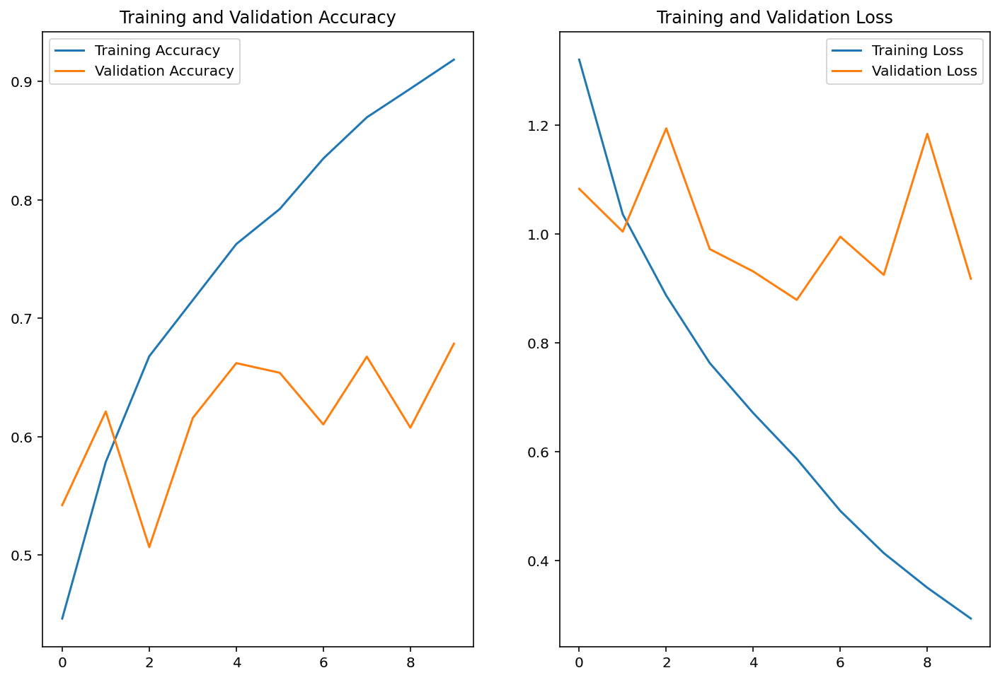

In [16]:
# 결과 그래프 출력
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss=history.history['loss']
val_loss=history.history['val_loss']

epochs_range = range(EPOCHS)

plt.figure(figsize=(12, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend()
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend()
plt.title('Training and Validation Loss')
plt.show()

In [17]:
# 모델의 예측 결과 확인
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    break

predictions

array([[5.60245849e-03, 1.00672431e-02, 2.81155914e-01, 2.53176242e-02,
        6.77856803e-01],
       [8.65972042e-01, 1.30312204e-01, 1.50482787e-03, 1.29435102e-05,
        2.19793874e-03],
       [5.88071585e-01, 6.96218014e-02, 4.01892178e-02, 3.00372094e-01,
        1.74529303e-03],
       [9.21484157e-02, 4.11252677e-01, 1.86079338e-01, 1.01430286e-02,
        3.00376505e-01],
       [9.39935565e-01, 2.64090728e-02, 4.35483688e-03, 1.73723488e-03,
        2.75632460e-02],
       [4.36120093e-01, 1.43473580e-01, 1.23692505e-01, 8.92905984e-03,
        2.87784666e-01],
       [1.44656049e-03, 2.14748293e-01, 6.47374868e-01, 2.94699660e-03,
        1.33483291e-01],
       [5.70614524e-02, 1.14070408e-01, 7.02960044e-02, 6.23942493e-03,
        7.52332687e-01],
       [1.44956389e-03, 1.97677611e-04, 1.73956051e-03, 9.96572018e-01,
        4.11096917e-05],
       [9.90198255e-01, 8.49691126e-03, 2.21285853e-04, 2.03653944e-05,
        1.06319250e-03],
       [9.64117706e-01, 2.2825

In [18]:
# prediction 값들을 실제 추론한 라벨로 변환
predictions = np.argmax(predictions, axis=1)
predictions

array([4, 0, 0, 1, 0, 0, 2, 4, 3, 0, 0, 3, 3, 4, 0, 3, 2, 3, 4, 4, 2, 0,
       1, 0, 1, 3, 2, 1, 2, 1, 0, 0])

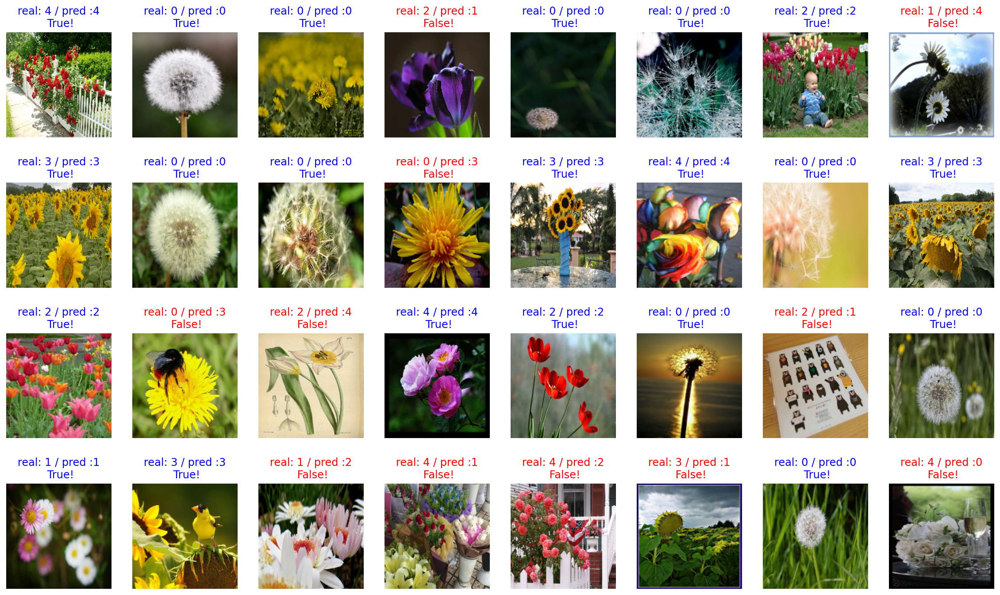

In [19]:
# prediction 시각화
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [20]:
count = 0   # 정답을 맞춘 개수
for image, label, prediction in zip(images, labels, predictions):
    if label == prediction:  # 예측이 맞았을 경우 count 증가
        count += 1


print(count / 32 * 100)

65.625


In [21]:
from sklearn.metrics import classification_report
import pandas as pd

# 훈련(Training) 및 검증(Validation) 데이터 성능 추출
train_loss = history.history['loss'][-1]  # 마지막 epoch 결과
train_accuracy = history.history['accuracy'][-1]
val_loss = history.history['val_loss'][-1]
val_accuracy = history.history['val_accuracy'][-1]

print(f"Training Loss: {train_loss:.4f}")
print(f"Training Accuracy: {train_accuracy:.4f}")
print(f"\nValidation Loss: {val_loss:.4f}")
print(f"Validation Accuracy: {val_accuracy:.4f}")

# 테스트(Test) 데이터 평가 (Loss, Accuracy)
test_loss, test_accuracy = model.evaluate(test_batches)
print(f"\nTest Loss: {test_loss:.4f}")
print(f"Test Accuracy: {test_accuracy:.4f}")

# 테스트 데이터에서 정밀도(Precision) & 재현율(Recall) 계산
y_true, y_pred = [], []
for image_batch, label_batch in test_batches:
    predictions = model.predict(image_batch)
    y_true.extend(label_batch.numpy())  # 실제 값
    y_pred.extend(np.argmax(predictions, axis=1))  # 예측 값

# classification_report를 사용하여 정밀도 & 재현율 계산
report = classification_report(y_true, y_pred, output_dict=True)
test_precision = report['weighted avg']['precision']
test_recall = report['weighted avg']['recall']

print(f"Test Precision: {test_precision:.4f}")
print(f"Test Recall: {test_recall:.4f}")

# 결과 저장 (DataFrame)
print("")
results = {
    'Dataset': ['Training', 'Validation', 'Test'],
    'Loss': [train_loss, val_loss, test_loss],
    'Accuracy': [train_accuracy, val_accuracy, test_accuracy],
    'Precision': [None, None, test_precision],  # Precision & Recall은 테스트 데이터에서만 계산
    'Recall': [None, None, test_recall]
}

df_results = pd.DataFrame(results)

# 결과 출력
print(df_results)

Training Loss: 0.2935
Training Accuracy: 0.9183

Validation Loss: 0.9173
Validation Accuracy: 0.6785
12/12 [==============================] - 0s 12ms/step - loss: 0.7870 - accuracy: 0.7193

Test Loss: 0.7870
Test Accuracy: 0.7193
Test Precision: 0.7238
Test Recall: 0.7193

      Dataset      Loss  Accuracy  Precision    Recall
0    Training  0.293458  0.918256        NaN       NaN
1  Validation  0.917301  0.678474        NaN       NaN
2        Test  0.787007  0.719346   0.723784  0.719346


# 4. 사전학습 모델 활용하기
## 4-1. VGG16
### 4-1-1. 모델 설계하기

In [22]:
IMG_SHAPE = (IMG_SIZE, IMG_SIZE, 3)

# VGG16을 base_model의 변수로 불러오기
base_model = tf.keras.applications.VGG16(input_shape=IMG_SHAPE,
                                         include_top=False,
                                         weights='imagenet')

In [23]:
image_batch.shape

TensorShape([15, 160, 160, 3])

In [24]:
# 모델에 넣은 배치 shape 확인하기
feature_batch = base_model(image_batch)
feature_batch.shape

TensorShape([15, 5, 5, 512])

In [25]:
base_model.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 160, 160, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 160, 160, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 160, 160, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 80, 80, 64)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 80, 80, 128)       73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 80, 80, 128)       147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 40, 40, 128)       0     

In [26]:
# Global Average Pooling 계층 만들기
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()

In [27]:
# 모델(Global Average Pooling 후)에 넣은 배치 shape 확인하기
feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)

(15, 512)


In [28]:
# 1. Dense Layer (512개 뉴런, ReLU 활성화)
dense_layer = tf.keras.layers.Dense(units=512, activation='relu')

# 2. Prediction Layer (5개 클래스, Softmax 활성화)
prediction_layer = tf.keras.layers.Dense(units=5, activation='softmax')

# 3. 예측 수행
prediction_batch = prediction_layer(dense_layer(feature_batch_average))

# 출력 결과
print(prediction_batch.shape)

(15, 5)


In [29]:
# base_model이 학습되지 않도록 고정(freeze)
base_model.trainable = False

# 최종 모델
model = tf.keras.Sequential([
  base_model,
  global_average_layer,
  dense_layer,
  prediction_layer
])

model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Functional)           (None, 5, 5, 512)         14714688  
_________________________________________________________________
global_average_pooling2d (Gl (None, 512)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 512)               262656    
_________________________________________________________________
dense_3 (Dense)              (None, 5)                 2565      
Total params: 14,979,909
Trainable params: 265,221
Non-trainable params: 14,714,688
_________________________________________________________________


### 4-1-2. 모델 학습시키기

In [30]:
base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

In [31]:
# 모델 학습
EPOCHS = 10
history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

Epoch 1/10
92/92 [==============================] - 17s 137ms/step - loss: 1.4031 - accuracy: 0.4816 - val_loss: 1.1851 - val_accuracy: 0.6403
Epoch 2/10
92/92 [==============================] - 8s 83ms/step - loss: 1.0768 - accuracy: 0.6846 - val_loss: 0.9522 - val_accuracy: 0.6948
Epoch 3/10
92/92 [==============================] - 8s 84ms/step - loss: 0.8989 - accuracy: 0.7313 - val_loss: 0.8215 - val_accuracy: 0.7221
Epoch 4/10
92/92 [==============================] - 8s 85ms/step - loss: 0.7920 - accuracy: 0.7548 - val_loss: 0.7422 - val_accuracy: 0.7602
Epoch 5/10
92/92 [==============================] - 8s 84ms/step - loss: 0.7195 - accuracy: 0.7725 - val_loss: 0.6903 - val_accuracy: 0.7629
Epoch 6/10
92/92 [==============================] - 8s 84ms/step - loss: 0.6649 - accuracy: 0.7878 - val_loss: 0.6619 - val_accuracy: 0.7738
Epoch 7/10
92/92 [==============================] - 8s 83ms/step - loss: 0.6249 - accuracy: 0.8069 - val_loss: 0.6193 - val_accuracy: 0.7929
Epoch 8/10


### 4-1-3. 모델 성능 평가하기

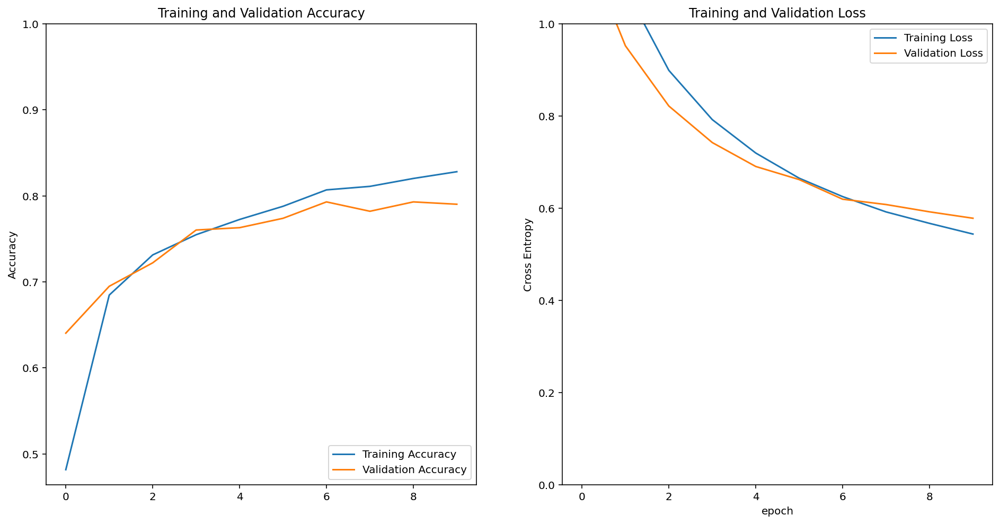

In [32]:
# 결과 그래프 출력
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

78.125


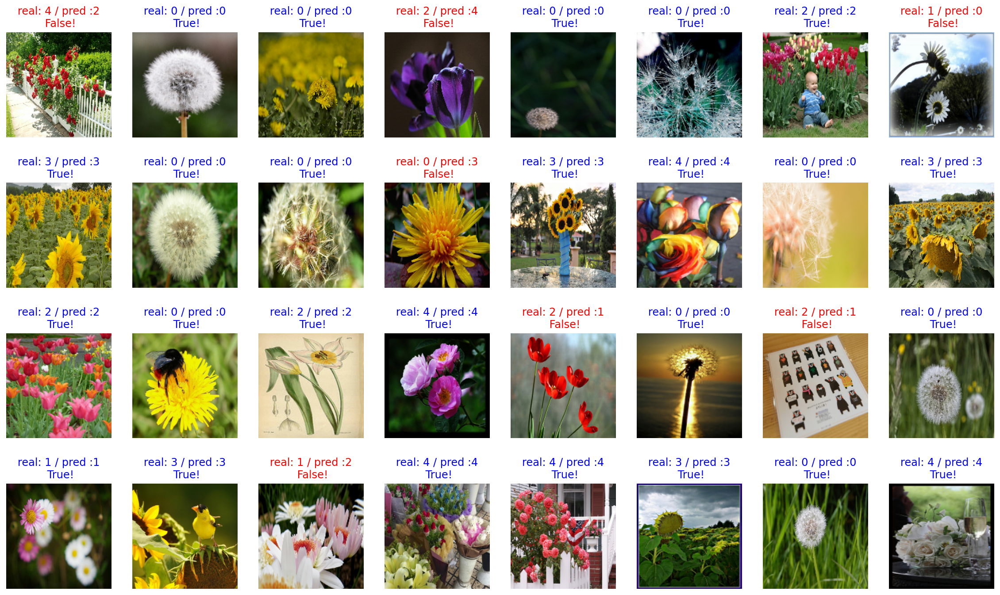

In [33]:
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    pass

predictions

predictions = np.argmax(predictions, axis=1)
predictions

plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')
    
count = 0
for image, label, prediction in zip(images, labels, predictions):
    correct = label == prediction
    if correct:
        count = count + 1

print(count / 32 * 100)

In [34]:
# 훈련(Training) 및 검증(Validation) 데이터 성능 추출
train_loss = history.history['loss'][-1]  # 마지막 epoch 결과
train_accuracy = history.history['accuracy'][-1]
val_loss = history.history['val_loss'][-1]
val_accuracy = history.history['val_accuracy'][-1]

print(f"Training Loss: {train_loss:.4f}")
print(f"Training Accuracy: {train_accuracy:.4f}")
print(f"\nValidation Loss: {val_loss:.4f}")
print(f"Validation Accuracy: {val_accuracy:.4f}")

# 테스트(Test) 데이터 평가 (Loss, Accuracy)
test_loss, test_accuracy = model.evaluate(test_batches)
print(f"\nTest Loss: {test_loss:.4f}")
print(f"Test Accuracy: {test_accuracy:.4f}")

# 테스트 데이터에서 정밀도(Precision) & 재현율(Recall) 계산
y_true, y_pred = [], []
for image_batch, label_batch in test_batches:
    predictions = model.predict(image_batch)
    y_true.extend(label_batch.numpy())  # 실제 값
    y_pred.extend(np.argmax(predictions, axis=1))  # 예측 값

# classification_report를 사용하여 정밀도 & 재현율 계산
report = classification_report(y_true, y_pred, output_dict=True)
test_precision = report['weighted avg']['precision']
test_recall = report['weighted avg']['recall']

print(f"Test Precision: {test_precision:.4f}")
print(f"Test Recall: {test_recall:.4f}")

# 결과 저장 (DataFrame)
print("")
results = {
    'Dataset': ['Training', 'Validation', 'Test'],
    'Loss': [train_loss, val_loss, test_loss],
    'Accuracy': [train_accuracy, val_accuracy, test_accuracy],
    'Precision': [None, None, test_precision],  # Precision & Recall은 테스트 데이터에서만 계산
    'Recall': [None, None, test_recall]
}

df_results = pd.DataFrame(results)

# 결과 출력
print(df_results)

Training Loss: 0.5436
Training Accuracy: 0.8280

Validation Loss: 0.5780
Validation Accuracy: 0.7902
12/12 [==============================] - 1s 66ms/step - loss: 0.5682 - accuracy: 0.8065

Test Loss: 0.5682
Test Accuracy: 0.8065
Test Precision: 0.8118
Test Recall: 0.8065

      Dataset      Loss  Accuracy  Precision   Recall
0    Training  0.543645  0.827997        NaN      NaN
1  Validation  0.577959  0.790191        NaN      NaN
2        Test  0.568245  0.806540   0.811776  0.80654


## 4-2. MobileNetV2
### 4-2-1. 모델 설계하기

In [35]:
# MobileNetV2 모델 불러오기
base_model = tf.keras.applications.MobileNetV2(input_shape=IMG_SHAPE,
                                               include_top=False,
                                               weights='imagenet')

In [36]:
from tensorflow.keras.layers import BatchNormalization, Dropout

# Global Average Pooling Layer 추가
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()

# FC Layer 구성 (Dropout & BatchNorm 추가)
dense_layer = tf.keras.Sequential([
    tf.keras.layers.Dense(units=256, activation='relu'),
    BatchNormalization(),
    Dropout(0.5),
])

# 최종 모델 구성
model = tf.keras.Sequential([
    base_model,
    global_average_layer,
    dense_layer,
    tf.keras.layers.Dense(units=5, activation='softmax')  # 5개 클래스
])

### 4-2-2. 모델 학습시키기

In [37]:
# base_model을 고정할지 여부 결정
base_model.trainable = False  # False면 feature extractor 역할만 함

# Optimizer 변경 & 학습률 설정
learning_rate = 0.00005
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(),
              metrics=['accuracy'])

# 학습 실행
EPOCHS = 20
history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

Epoch 1/20
92/92 [==============================] - 7s 48ms/step - loss: 1.6339 - accuracy: 0.4554 - val_loss: 0.8620 - val_accuracy: 0.7003
Epoch 2/20
92/92 [==============================] - 4s 34ms/step - loss: 1.0035 - accuracy: 0.6652 - val_loss: 0.6509 - val_accuracy: 0.7875
Epoch 3/20
92/92 [==============================] - 4s 34ms/step - loss: 0.7871 - accuracy: 0.7337 - val_loss: 0.5624 - val_accuracy: 0.7902
Epoch 4/20
92/92 [==============================] - 4s 35ms/step - loss: 0.6397 - accuracy: 0.7807 - val_loss: 0.5029 - val_accuracy: 0.8202
Epoch 5/20
92/92 [==============================] - 4s 34ms/step - loss: 0.5556 - accuracy: 0.8011 - val_loss: 0.4688 - val_accuracy: 0.8365
Epoch 6/20
92/92 [==============================] - 4s 35ms/step - loss: 0.4705 - accuracy: 0.8324 - val_loss: 0.4482 - val_accuracy: 0.8501
Epoch 7/20
92/92 [==============================] - 4s 34ms/step - loss: 0.4649 - accuracy: 0.8334 - val_loss: 0.4303 - val_accuracy: 0.8638
Epoch 8/20
92

### 4-2-3. 모델 성능 평가하기

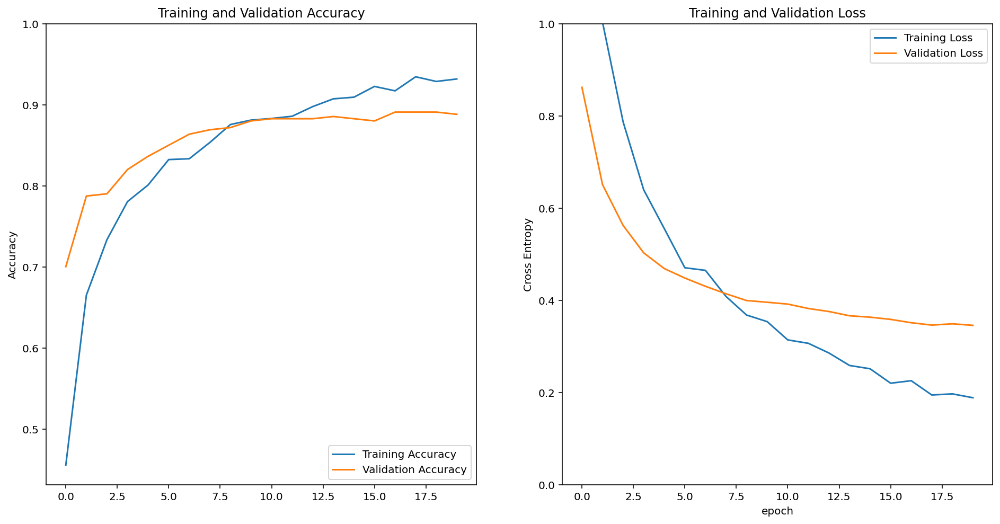

In [38]:
# 결과 그래프 출력
plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

84.375


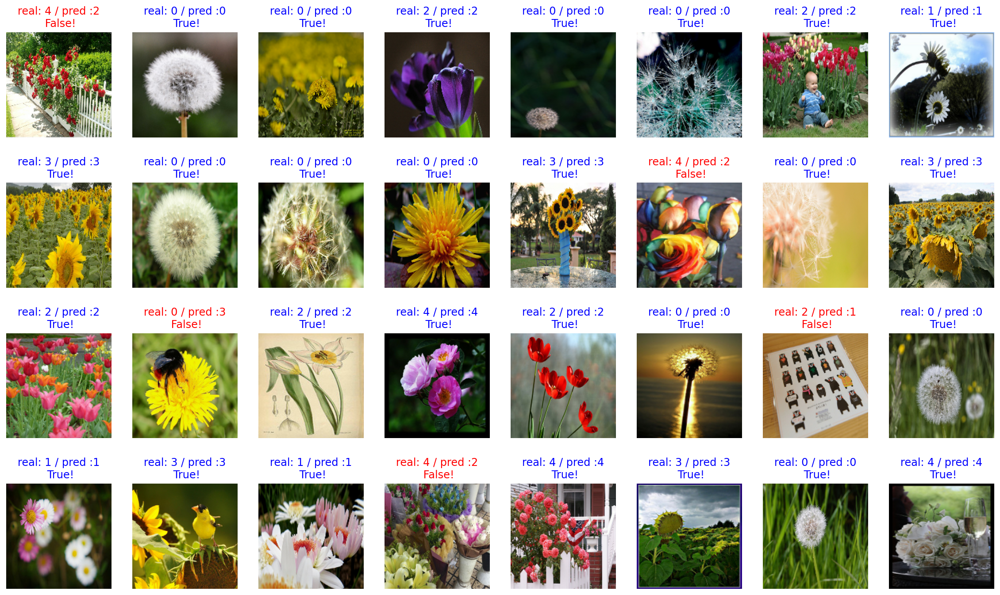

In [39]:
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    pass

predictions

predictions = np.argmax(predictions, axis=1)
predictions

plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')
    
count = 0
for image, label, prediction in zip(images, labels, predictions):
    correct = label == prediction
    if correct:
        count = count + 1

print(count / 32 * 100)

In [40]:
# 훈련(Training) 및 검증(Validation) 데이터 성능 추출
train_loss = history.history['loss'][-1]  # 마지막 epoch 결과
train_accuracy = history.history['accuracy'][-1]
val_loss = history.history['val_loss'][-1]
val_accuracy = history.history['val_accuracy'][-1]

print(f"Training Loss: {train_loss:.4f}")
print(f"Training Accuracy: {train_accuracy:.4f}")
print(f"\nValidation Loss: {val_loss:.4f}")
print(f"Validation Accuracy: {val_accuracy:.4f}")

# 테스트(Test) 데이터 평가 (Loss, Accuracy)
test_loss, test_accuracy = model.evaluate(test_batches)
print(f"\nTest Loss: {test_loss:.4f}")
print(f"Test Accuracy: {test_accuracy:.4f}")

# 테스트 데이터에서 정밀도(Precision) & 재현율(Recall) 계산
y_true, y_pred = [], []
for image_batch, label_batch in test_batches:
    predictions = model.predict(image_batch)
    y_true.extend(label_batch.numpy())  # 실제 값
    y_pred.extend(np.argmax(predictions, axis=1))  # 예측 값

# classification_report를 사용하여 정밀도 & 재현율 계산
report = classification_report(y_true, y_pred, output_dict=True)
test_precision = report['weighted avg']['precision']
test_recall = report['weighted avg']['recall']

print(f"Test Precision: {test_precision:.4f}")
print(f"Test Recall: {test_recall:.4f}")

# 결과 저장 (DataFrame)
print("")
results = {
    'Dataset': ['Training', 'Validation', 'Test'],
    'Loss': [train_loss, val_loss, test_loss],
    'Accuracy': [train_accuracy, val_accuracy, test_accuracy],
    'Precision': [None, None, test_precision],  # Precision & Recall은 테스트 데이터에서만 계산
    'Recall': [None, None, test_recall]
}

df_results = pd.DataFrame(results)

# 결과 출력
print(df_results)

Training Loss: 0.1884
Training Accuracy: 0.9319

Validation Loss: 0.3455
Validation Accuracy: 0.8883
12/12 [==============================] - 0s 25ms/step - loss: 0.2809 - accuracy: 0.8937

Test Loss: 0.2809
Test Accuracy: 0.8937
Test Precision: 0.8949
Test Recall: 0.8937

      Dataset      Loss  Accuracy  Precision    Recall
0    Training  0.188425  0.931880        NaN       NaN
1  Validation  0.345523  0.888283        NaN       NaN
2        Test  0.280889  0.893733   0.894884  0.893733


### MobileNetV2 성능 개선하기 → 최종 모델 채택 !

In [41]:
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint

# 콜백 정의
callbacks = [
    EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True),  # 5 epoch 동안 개선 없으면 중단
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, verbose=1),  # 성능 개선 없으면 학습률 감소
    ModelCheckpoint(filepath='best_model.h5', save_best_only=True, monitor='val_accuracy', verbose=1)  # 최고 모델 저장
]

# MobileNetV2 모델 불러오기
base_model = tf.keras.applications.MobileNetV2(input_shape=IMG_SHAPE,
                                               include_top=False,
                                               weights='imagenet')

# Global Average Pooling Layer 추가
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()

# FC Layer 구성 (Dropout & BatchNorm 추가)
dense_layer = tf.keras.Sequential([
    tf.keras.layers.Dense(units=256, activation='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dropout(0.5),
])

# 최종 모델 구성
model = tf.keras.Sequential([
    base_model,
    global_average_layer,
    dense_layer,
    tf.keras.layers.Dense(units=5, activation='softmax')  # 5개 클래스
])

# base_model을 고정할지 여부 결정
base_model.trainable = False  # False면 feature extractor 역할만 함

# Optimizer 변경 & 학습률 설정
learning_rate = 0.00005
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(),
              metrics=['accuracy'])

# 🔍체크포인트 경로 설정
checkpoint_path = "/aiffel/tf_flowers/best_model.h5"
callbacks = [
    EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, verbose=1),
    ModelCheckpoint(filepath=checkpoint_path, save_best_only=True, monitor='val_accuracy', verbose=1)
]

# 모델 학습 실행 (콜백 포함)
EPOCHS = 50  # EarlyStopping이 있기 때문에 크게 설정 가능
history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches,
                    callbacks=callbacks)  # 콜백 적용!

Epoch 1/50
92/92 [==============================] - 7s 41ms/step - loss: 1.8884 - accuracy: 0.3927 - val_loss: 0.8935 - val_accuracy: 0.6594

Epoch 00001: val_accuracy improved from -inf to 0.65940, saving model to /aiffel/tf_flowers/best_model.h5
Epoch 2/50
92/92 [==============================] - 4s 34ms/step - loss: 1.0559 - accuracy: 0.6379 - val_loss: 0.6081 - val_accuracy: 0.7902

Epoch 00002: val_accuracy improved from 0.65940 to 0.79019, saving model to /aiffel/tf_flowers/best_model.h5
Epoch 3/50
92/92 [==============================] - 4s 34ms/step - loss: 0.8012 - accuracy: 0.7231 - val_loss: 0.4979 - val_accuracy: 0.8229

Epoch 00003: val_accuracy improved from 0.79019 to 0.82289, saving model to /aiffel/tf_flowers/best_model.h5
Epoch 4/50
92/92 [==============================] - 4s 34ms/step - loss: 0.6732 - accuracy: 0.7633 - val_loss: 0.4411 - val_accuracy: 0.8447

Epoch 00004: val_accuracy improved from 0.82289 to 0.84469, saving model to /aiffel/tf_flowers/best_model.h5

In [42]:
# 🔍학습 결과 저장
model.save(checkpoint_path)
print(f"✅ 모델이 저장되었습니다: {checkpoint_path}")

✅ 모델이 저장되었습니다: /aiffel/tf_flowers/best_model.h5


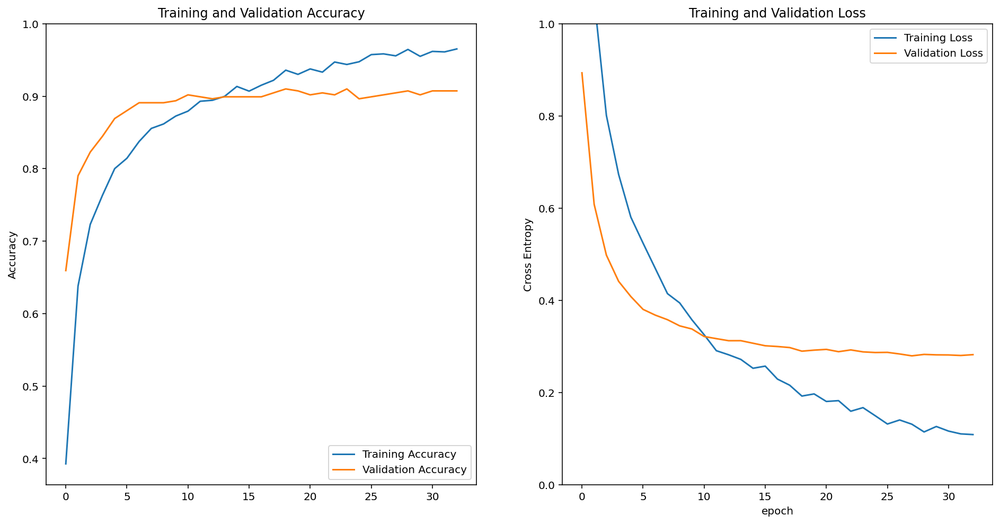

Training Loss: 0.1085
Training Accuracy: 0.9653

Validation Loss: 0.2820
Validation Accuracy: 0.9074
12/12 [==============================] - 0s 25ms/step - loss: 0.2875 - accuracy: 0.8910

Test Loss: 0.2875
Test Accuracy: 0.8910
Test Precision: 0.8915
Test Recall: 0.8910

      Dataset      Loss  Accuracy  Precision    Recall
0    Training  0.108519  0.965259        NaN       NaN
1  Validation  0.281959  0.907357        NaN       NaN
2        Test  0.287462  0.891008   0.891548  0.891008


In [43]:
# 결과 그래프 출력
plt.figure(figsize=(16, 8))

# Accuracy 그래프
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

# Loss 그래프
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

# 훈련(Training) 및 검증(Validation) 데이터 성능 추출
train_loss = history.history['loss'][-1]  # 마지막 epoch 결과
train_accuracy = history.history['accuracy'][-1]
val_loss = history.history['val_loss'][-1]
val_accuracy = history.history['val_accuracy'][-1]

print(f"Training Loss: {train_loss:.4f}")
print(f"Training Accuracy: {train_accuracy:.4f}")
print(f"\nValidation Loss: {val_loss:.4f}")
print(f"Validation Accuracy: {val_accuracy:.4f}")

# 테스트(Test) 데이터 평가 (Loss, Accuracy)
test_loss, test_accuracy = model.evaluate(test_batches)
print(f"\nTest Loss: {test_loss:.4f}")
print(f"Test Accuracy: {test_accuracy:.4f}")

# 테스트 데이터에서 정밀도(Precision) & 재현율(Recall) 계산
y_true, y_pred = [], []
for image_batch, label_batch in test_batches:
    predictions = model.predict(image_batch)
    y_true.extend(label_batch.numpy())  # 실제 값
    y_pred.extend(np.argmax(predictions, axis=1))  # 예측 값

# classification_report를 사용하여 정밀도 & 재현율 계산
report = classification_report(y_true, y_pred, output_dict=True)
test_precision = report['weighted avg']['precision']
test_recall = report['weighted avg']['recall']

print(f"Test Precision: {test_precision:.4f}")
print(f"Test Recall: {test_recall:.4f}")

# 결과 저장 (DataFrame)
print("")
results = {
    'Dataset': ['Training', 'Validation', 'Test'],
    'Loss': [train_loss, val_loss, test_loss],
    'Accuracy': [train_accuracy, val_accuracy, test_accuracy],
    'Precision': [None, None, test_precision],  # Precision & Recall은 테스트 데이터에서만 계산
    'Recall': [None, None, test_recall]
}

df_results = pd.DataFrame(results)

# 결과 출력
print(df_results)

In [44]:
import os

checkpoint_dir = os.getenv("HOME") + "/aiffel/tf_flowers/checkpoint"
checkpoint_file_path = os.path.join(checkpoint_dir, 'best_model.h5')

# 체크포인트 디렉토리 생성
os.makedirs(checkpoint_dir, exist_ok=True)

# 모델 저장
model.save(checkpoint_file_path)  # 모델 전체 저장

if os.path.exists(checkpoint_file_path):
    print('모델 저장 완료!')

# 모델 복원
model = tf.keras.models.load_model(checkpoint_file_path)
print('모델 복원 완료!')

모델 저장 완료!
모델 복원 완료!


# 5. 모델 활용하기

In [45]:
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import load_img, img_to_array

In [46]:
# 모델 로드
checkpoint_dir = os.getenv("HOME") + "/aiffel/tf_flowers/checkpoint"
model_path = os.path.join(checkpoint_dir, "best_model.h5")  # 저장한 모델 경로 사용
if not os.path.exists(model_path):
    raise FileNotFoundError(f"🚨 모델 파일이 존재하지 않습니다: {model_path}")

model = load_model(model_path)
print("✅ 모델 로드 완료!")

# 이미지 디렉토리 경로
img_dir_path = os.getenv("HOME") + "/aiffel/tf_flowers/images"
if not os.path.exists(img_dir_path):
    raise FileNotFoundError(f"🚨 이미지 디렉토리가 존재하지 않습니다: {img_dir_path}")

# 클래스 라벨 정의 (metadata 없이 직접 지정)
class_names = ["daisy", "dandelion", "roses", "sunflowers", "tulips"]  # 모델에 맞게 수정

def show_and_predict_image(dirpath, filename, img_size=160):
    """
    지정된 디렉토리(dirpath)에서 파일(filename)을 로드하여 
    모델 예측 결과를 출력하는 함수
    """
    filepath = os.path.join(dirpath, filename)
    
    # 파일 존재 여부 확인
    if not os.path.exists(filepath):
        raise FileNotFoundError(f"🚨 파일이 존재하지 않습니다: {filepath}")

    # 이미지 로드 및 표시
    image = load_img(filepath, target_size=(img_size, img_size))
    plt.imshow(image)
    plt.axis('off')
    plt.show()

    # 이미지 전처리
    image = img_to_array(image).reshape(1, img_size, img_size, 3) / 255.0  # 정규화

    # 모델 예측
    prediction = model.predict(image)[0]

    # 클래스별 확률 출력
    print("\n📊 클래스별 확률:")
    for i, class_name in enumerate(class_names):
        print(f"  {class_name}: {round(prediction[i] * 100, 2)}%")

    # 가장 높은 확률을 가진 클래스 예측
    predicted_class = class_names[np.argmax(prediction)]
    print(f"\n🔹 Predicted class: {predicted_class}")

✅ 모델 로드 완료!


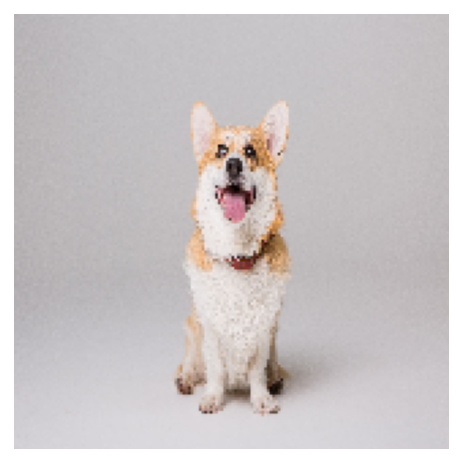


📊 클래스별 확률:
  daisy: 1.1%
  dandelion: 0.31%
  roses: 7.82%
  sunflowers: 0.38%
  tulips: 90.39%

🔹 Predicted class: tulips


In [47]:
# 테스트 실행
show_and_predict_image(img_dir_path, "my_dog.jpg")  # 사용할 이미지 파일명으로 변경!

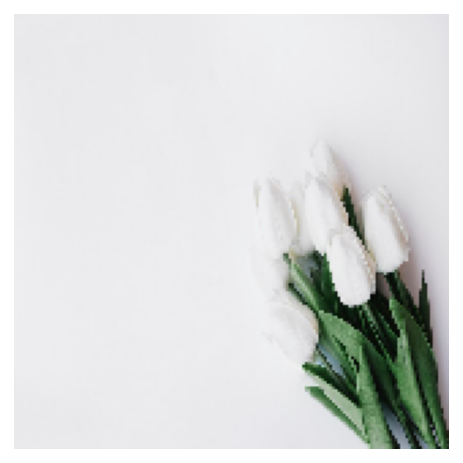


📊 클래스별 확률:
  daisy: 0.06%
  dandelion: 0.74%
  roses: 52.9%
  sunflowers: 0.0%
  tulips: 46.3%

🔹 Predicted class: roses


In [48]:
show_and_predict_image(img_dir_path, "tulips.jpg")

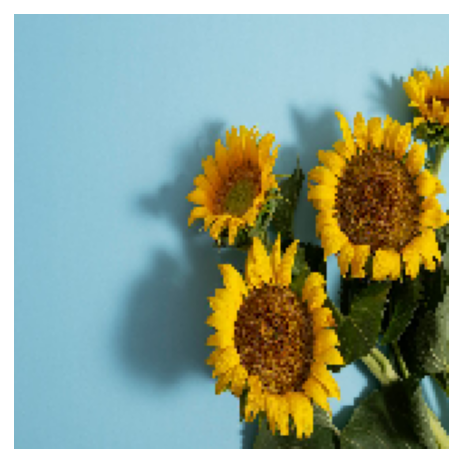


📊 클래스별 확률:
  daisy: 0.12%
  dandelion: 0.01%
  roses: 0.0%
  sunflowers: 99.85%
  tulips: 0.02%

🔹 Predicted class: sunflowers


In [49]:
show_and_predict_image(img_dir_path, "sunflowers.jpg")